# Formalia:

Please read the [assignment overview page](https://github.com/suneman/socialgraphs2019/wiki/Assignments) carefully before proceeding. This page contains information about formatting (including formats etc), group sizes, and many other aspects of handing in the assignment. 

*If you fail to follow these simple instructions, it will negatively impact your grade!*

**Due date and time**: The assignment is due on Tuesday November 5th at 23:55. Hand in your IPython notebook file (with extension `.ipynb`) via http://peergrade.io/.

# Part 1: Twitter Network Analysis

_Exercise_ 1: Build the network of retweets.
We will now build a network that has as nodes the Twitter handles of the members of the house, and direct edges between nodes A and B if A has retweeted content posted by B. We will build a weighted network, where the weight of an edge is equal to the number of retweets. You can build the network following the steps below (and you should  be able to reuse many of the functions you have written as part of the exercises during the previous weeks):

* Consider the 200 most recent tweets written by each member of the house (use the files [here](https://github.com/suneman/socialgraphs2019/tree/master/files/data_twitter/tweets_2019.zip/). For each file, use a regular expression to find retweets and to extract the Twitter handle of the user whose content was retweeted. All retweets begin with "*RT @originalAuthor:*", where "*originalAuthor*" is the handle of the user whose content was retweeted (and the part of the text you want to extract).

In [5]:
# Load the necessary packages

import matplotlib.pyplot as plt
import numpy as np
import sys, os, re
import pandas as pd
import networkx as nx

In [117]:
ls

Assignment1.2.ipynb         Assignment2.ipynb              tweets_2019_full/
Assignment2.1-Gustaw.ipynb  H115_tw_2019.csv               Wikipedia_Graph.PNG
Assignment2.1.ipynb         journal.pone.0026752.s001.TXT
Assignment2.3_Ali.ipynb     sentiment_weights.txt


In [270]:
# Load first the data

path = "./tweets_2019_full"

retweet_dict = {}

for file in os.listdir(path):
    name = file
    persons_tweets = open(path + '/' + file, encoding= 'utf-8').read()
    handles = re.findall("RT\s\@\w+\:", persons_tweets)
    handle_list = []
    for handle in handles:
        handle_list.append(handle.split("@")[1].split(":")[0])
    retweet_dict[file] = handle_list



* For each retweet, check if the handle retweeted is, in fact, the handle of a member of the house. If yes, keep it. If no, discard it.

In [271]:
path_tw_handles = "C:/Users/Bruger/Dropbox/UNI/9. Semester/Social graphs & Interactions/socialgraphs2019/files/data_twitter"

h115_tw = pd.read_csv(path_tw_handles + "/H115_tw_2019.csv")

tw_handles = list(h115_tw['tw_name']) # Find the twitter handles to compare

for politician in retweet_dict.keys():
    politician_retweets = retweet_dict[politician]
    house_retweets = []
    for OGAuthor in politician_retweets:
        if OGAuthor in tw_handles:
            house_retweets.append(OGAuthor)
    retweet_dict[politician] = house_retweets  # Update the dictionary such that it only contains the handles of house members

* Use a NetworkX [`DiGraph`](https://networkx.github.io/documentation/development/reference/classes.digraph.html) to store the network. Use weighted edges to account for multiple retweets. Also store the party of each member as a node attribute (use the data in [this file](https://github.com/suneman/socialgraphs2019/blob/master/files/data_twitter/H115_tw_2019.csv). Remove self-loops (edges that connect a node with itself).

In [272]:
twitter_graph = nx.DiGraph()

twitter_graph.add_nodes_from(list(h115_tw['Name']))

edge_dict = {}
for member in retweet_dict.keys():
    member_real_name = h115_tw[h115_tw['WikiPageName'] == member].values[0][3] # Get the real name of the meber
    for link in retweet_dict[member]:
        link_real_name = h115_tw[h115_tw['tw_name'] == link].values[0][3]      # Get the real name of the retweeted user
        if link_real_name == member_real_name: # skips self-loops
            continue
        else:
            # Check if we have already seen this link before
            if (member_real_name, link_real_name) in edge_dict.keys():
                edge_dict[(member_real_name, link_real_name)] += 1     # Increment if seen
            else:
                edge_dict[(member_real_name, link_real_name)] = 1      # Add this link in the dictionary 

# Add the edges
for pair in edge_dict:
    twitter_graph.add_edge(pair[0], pair[1], weight = edge_dict[pair])

 _Exercise_ 2: Visualize the network of retweets and investigate differences between the parties.
 * Visualize the network using the [Networkx draw function](https://networkx.github.io/documentation/stable/reference/generated/networkx.drawing.nx_pylab.draw.html#networkx.drawing.nx_pylab.draw), and nodes coordinates from the force atlas algorithm. *Hint: use an undirected version of the graph to find the nodes positions for better results, but stick to the directed version for all measurements.* Plot nodes in colors according to their party (e.g. 'red' for republicans and 'blue' for democrats) and set the node-size to be proportional to total degree. 
 
 

100%|████████████████████████████████████████████████████████████████████████████████| 400/400 [00:06<00:00, 64.83it/s]


BarnesHut Approximation  took  0.62  seconds
Repulsion forces  took  5.21  seconds
Gravitational forces  took  0.03  seconds
Attraction forces  took  0.02  seconds
AdjustSpeedAndApplyForces step  took  0.10  seconds


(-436323.8072524824, 435506.35438281274, -54976.55235771269, 54562.09803440746)

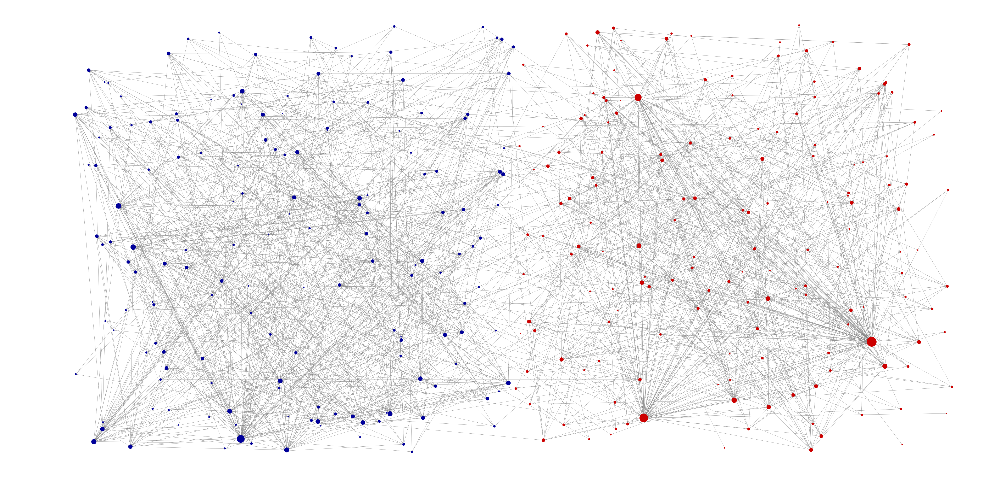

In [296]:
from fa2 import ForceAtlas2
color_map = []

for party in h115_tw['Party']:
    if party == 'Democratic':
        color_map.append('#000099')
    else:
        color_map.append('#cc0000')

undir_tw_G = nx.Graph(twitter_graph)
force_atlas2 = ForceAtlas2()
positions = force_atlas2.forceatlas2_networkx_layout(undir_tw_G, pos=None, iterations=400)

for idx, key in enumerate(positions):
    if 'Democratic' == h115_tw['Party'][idx]:
        positions[key] = (positions[key][0] - np.random.randint(100,400000), positions[key][1] + np.random.randint(-50000,50000))
    else:
        positions[key] = (positions[key][0] + np.random.randint(100,400000), positions[key][1]+ np.random.randint(-50000,50000))

plt.figure(figsize=(30,15), dpi=200)
nx.draw_networkx_nodes(undir_tw_G, pos=positions, node_color = color_map, 
                       node_size = [2*v for v in dict(twitter_graph.degree()).values()])

nx.draw_networkx_edges(undir_tw_G, pos=positions, edge_color= 'grey', width = 0.25 )
plt.axis('off')

 * Compare the network of Retweets with the network of Wikipedia pages (generated during Week 5). Do you observe any differences? How do you explain them?
 

> Lets start by showing the graph of the Wikipedia pages that was generated during Week 5. ![title](Wikipedia_Graph.PNG)
Comparing the 2 figures, we notice that the Wikipedia page graph has many more connections between the parties. This is most likely due to the fact that in twitter you share more info that is relevant to you and your causes which of course is more likely to happen from other members of the same party.

* Now set the node-size tob proportional to betweenness centrality. Do you observe any changes?

**Answer:**
> First of all we had to scale the size of the node by a large amount (multiplied centrality with 1000) to actually be able to observe the nodes. The first thing to notice is that a lot of nodes seems to have disappeared, which is due to the fact that a lot of nodes has a betweenness centrality of 0. This means that no shortest path between two nodes passes these nodes. 

(-437592.9593399102, 436974.3944420651, -54849.06428046565, 55164.49221761385)

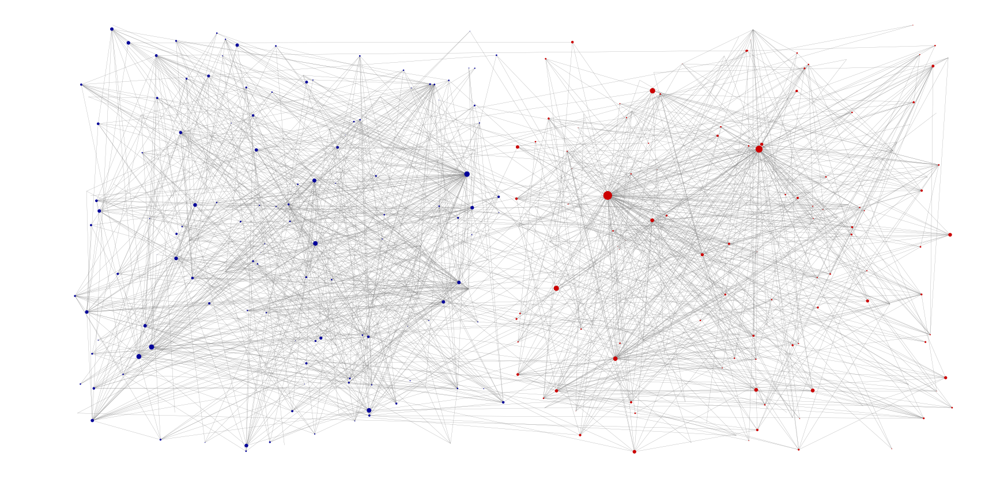

In [274]:
between_centrality = nx.algorithms.centrality.betweenness_centrality(twitter_graph)

plt.figure(figsize=(30,15))
nx.draw_networkx_nodes(undir_tw_G, pos=positions, node_color = color_map, 
                       node_size = [1000*v for v in between_centrality.values()])

nx.draw_networkx_edges(undir_tw_G, pos=positions, edge_color= 'grey', width = 0.25 )
plt.axis('off')

* Repeat the point above using eigenvector centrality. Again, do you see a difference? Can you explain why based on what eigenvector centrality measures?

**Answer**
> Again we notice a huge difference. First of all, all the nodes of the democratic party members seems to have disappeared or appear very small. To explain this, we must remind ourselves what the eigenvector centrality measures. The eigenvector centrality reads "_A node is important if it is linked to by other important nodes._" Looking at the first graph, we notice that a lot of the large republican nodes (they're large because they have a high degree in this case) links to other small degree nodes. The large nodes also seems to connect to other large nodes as well. This is not the case for the democratic party members as most hubs just connect to small unimportant nodes. That is why the small nodes in the first graph becomes more important in the eigenvector centrality graph for the republican nodes. Essentially this means that the important figures in the republican party tends to retweet more the less important persons in the party.

(-437592.9589771166, 436974.3957810103, -54849.06766488745, 55164.49237877679)

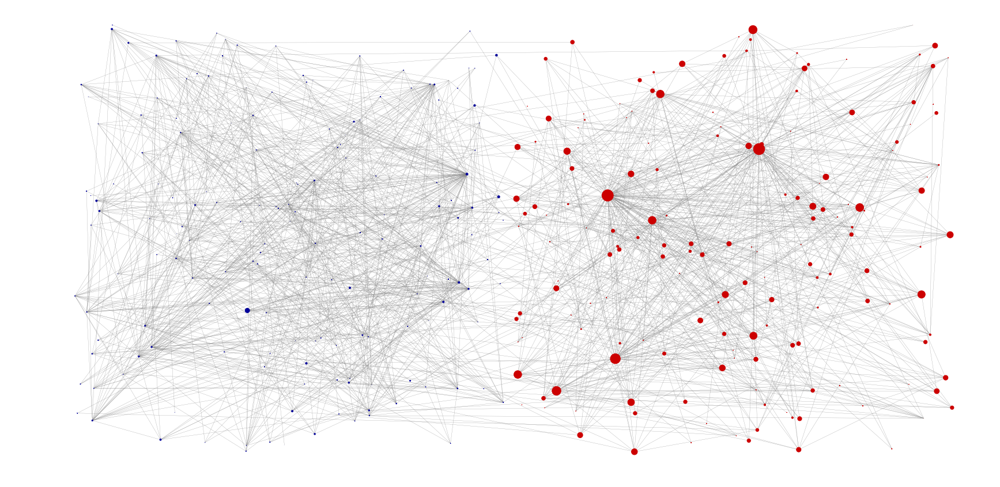

In [275]:
eigen_centrality = nx.algorithms.centrality.eigenvector_centrality(twitter_graph)

plt.figure(figsize=(30,15))
nx.draw_networkx_nodes(undir_tw_G, pos=positions, node_color = color_map, 
                       node_size = [1000*v for v in eigen_centrality.values()])

nx.draw_networkx_edges(undir_tw_G, pos=positions, edge_color= 'grey', width = 0.25 )
plt.axis('off')

In [290]:
len(list(twitter_graph.nodes))

336

* Who are the three nodes with highest degree within each party? And what is their eigenvector centrality? And their betweenness centrality?


In [276]:
# Store the eigenvector and betweenness centralities in new variables where they are seperated by party
dem_eigen = []
dem_betweeness = []
for dem_member in dem_members:
    dem_eigen.append((dem_member, eigen_centrality[dem_member]))
    dem_betweeness.append((dem_member, between_centrality[dem_member]))
    
rep_eigen = []
rep_betweeness = []
for rep_member in rep_members:
    rep_eigen.append((rep_member, eigen_centrality[rep_member]))
    rep_betweeness.append((rep_member, between_centrality[rep_member]))

# find the top 3 of each
top3_eigen_dem = sorted(dem_eigen, key=lambda x: x[1], reverse=True)[:3]
top3_between_dem = sorted(dem_betweeness, key=lambda x: x[1], reverse=True)[:3]
top3_eigen_rep = sorted(rep_eigen, key=lambda x: x[1], reverse=True)[:3]
top3_between_rep = sorted(rep_betweeness, key=lambda x: x[1], reverse=True)[:3]

node_list = list(twitter_graph.nodes())
max_degree_nodes_ = np.argsort(list(dict(twitter_graph.degree(dem_members)).values()))
highest_n = 3
for count, idx in enumerate(max_degree_nodes[-highest_n:]):
    print('The {} highest degree node is:'.format(highest_n-count), node_list[idx], ', Eigenvector Centrality:', 
         round(eigen_centrality[node_list[idx]],5), ', Betweeness Centrality:', round(between_centrality[node_list[idx]],5))


The 3 highest degree node is: Nancy Pelosi , Eigenvector Centrality: 0.01364 Betweeness Centrality: 0.06985
The 2 highest degree node is: Steve Scalise , Eigenvector Centrality: 0.37945 Betweeness Centrality: 0.12279
The 1 highest degree node is: Kevin McCarthy , Eigenvector Centrality: 0.38962 Betweeness Centrality: 0.20013


In [345]:
node_list = list(twitter_graph.nodes())
max_degree_nodes = np.argsort(list(dict(twitter_graph.degree()).values()))

democrats_counter = 0
republican_counter = 0
idx = 0
democrats = []
republicans = []
while(democrats_counter < 3 or republican_counter < 3):
    name = node_list[max_degree_nodes[idx]]
    party = h115_tw[h115_tw['Name'] == name]['Party'].item()
    if party == 'Democratic':
        democrats_counter += 1
        democrats.append(name)
    else:
        republican_counter += 1
        republicans.append(name)
    idx += 1

for i in range(len(democrats)):
    print('The {} highest degree node is:'.format(i+1), democrats[i], ', Eigenvector Centrality:', 
         round(eigen_centrality[democrats[i]],5), ', Betweeness Centrality:', round(between_centrality[democrats[i]],5))
print()
for i in range(len(republicans)):
    print('The {} highest degree node is:'.format(i+1), republicans[i], ', Eigenvector Centrality:', 
         round(eigen_centrality[republicans[i]],5), ', Betweeness Centrality:', round(between_centrality[republicans[i]],5))

The 1 highest degree node is: Tim Walz , Eigenvector Centrality: 0.0 , Betweeness Centrality: 0.0
The 2 highest degree node is: John Garamendi , Eigenvector Centrality: 0.0 , Betweeness Centrality: 0.0
The 3 highest degree node is: Tom O'Halleran , Eigenvector Centrality: 0.0 , Betweeness Centrality: 0.0
The 4 highest degree node is: Tulsi Gabbard , Eigenvector Centrality: 0.0 , Betweeness Centrality: 0.0
The 5 highest degree node is: Henry Cuellar , Eigenvector Centrality: 0.0 , Betweeness Centrality: 0.0

The 1 highest degree node is: Roger Marshall , Eigenvector Centrality: 0.0 , Betweeness Centrality: 0.0
The 2 highest degree node is: Bill Posey , Eigenvector Centrality: 0.0 , Betweeness Centrality: 0.0
The 3 highest degree node is: Tom McClintock , Eigenvector Centrality: 0.0 , Betweeness Centrality: 0.0


In [343]:
max_degree_nodes

array([120, 314, 145, 319, 205, 138,  89, 135,   6,  76,  71,   3,   7,
       261, 104, 254, 282, 274, 269, 133, 134,  95,   0, 140, 332, 187,
       169,  21, 198,  53,  18, 315, 225, 224,  58, 271,  60, 267, 186,
        69, 129,  73, 264, 194, 119, 113,  90, 183,  93, 202, 256,  98,
        83,  88,  92, 318,  40, 279,  32,  20,  33, 296, 305, 163, 168,
        39, 191, 121,  94, 219, 257, 255, 103, 248, 249,   5,  34, 265,
       263, 131, 273,  62, 179, 141, 313, 189,   2, 231,  45, 268, 109,
       132, 312, 307,  74, 266, 147,  15, 245, 230, 327, 166, 326, 239,
       124, 164,  54,  26, 242, 117, 203,  86, 284, 176, 304,  65,  48,
       173, 260,  37,  72, 299, 171, 100, 216, 322,  91, 277,  44, 325,
       142,  64, 181, 177, 320, 105, 294, 310, 331,  77, 306, 196, 236,
       126,  84, 297, 243, 222,  28, 136, 102, 192, 180, 197, 212,  55,
       184,  81, 295,  99, 154,  70,  68, 244, 281,  63, 123, 125, 234,
        51, 232, 272, 150,  78, 286, 185, 211, 250, 237, 195, 23

In [314]:
dict(twitter_graph.degree(dem_members)).va

{'Steny Hoyer': 22,
 'Marcy Kaptur': 3,
 'Pete Visclosky': 0,
 'Peter DeFazio': 0,
 'John Lewis': 11,
 'Nancy Pelosi': 76,
 'Frank Pallone': 11,
 'Eliot Engel': 9,
 'Nita Lowey': 7,
 'Richard Neal': 8,
 'José E. Serrano': 4,
 'David Price': 10,
 'Rosa DeLauro': 13,
 'Maxine Waters': 1,
 'Jerrold Nadler': 22,
 'Jim Cooper': 2,
 'Jim Clyburn': 25,
 'Anna Eshoo': 8,
 'Gene Green': 12,
 'Alcee Hastings': 7,
 'Carolyn Maloney': 13,
 'Lucille Roybal-Allard': 5,
 'Bobby Rush': 23,
 'Bobby Scott': 29,
 'Bennie Thompson': 12,
 'Lloyd Doggett': 2,
 'Michael F. Doyle': 3,
 'Sheila Jackson Lee': 8,
 'Zoe Lofgren': 13,
 'Elijah Cummings': 16,
 'Earl Blumenauer': 3,
 'Danny K. Davis': 13,
 'Diana DeGette': 13,
 'Ron Kind': 3,
 'Jim McGovern': 21,
 'Bill Pascrell': 12,
 'Brad Sherman': 4,
 'Adam Smith': 10,
 'Gregory Meeks': 6,
 'Barbara Lee': 19,
 'Joe Crowley': 4,
 'John B. Larson': 6,
 'Grace Napolitano': 15,
 'Jan Schakowsky': 17,
 'Mike Thompson': 28,
 'Lacy Clay': 9,
 'Susan Davis': 3,
 'James 

* Plot (on the same figure) the distribution of outgoing strength for the republican and democratic nodes repectively (i.e. the sum of the weight on outgoing links). Which party is more active in retweeting other members of the house?

In [277]:

# Define the variables to store the information about which members are republican and democrats respectively. 
rep_members = []
dem_members = []

# Find out which member belongs to which party and store it
for key in h115_tw['Name']:
    if h115_tw[h115_tw['Name'] == key]['Party'].item() == 'Republican':
        rep_members.append(key)
    else:
        dem_members.append(key)

        
# Count the freqeuncies of how many has degree 0, degree 1 etc. for both parties. 
# Keys are the degree and values are the freq
out_deg_rep = {}
for rep in rep_members:
    out_deg = twitter_graph.out_degree(rep)
    if out_deg in out_deg_rep:
        out_deg_rep[out_deg] += 1
    else:
        out_deg_rep[out_deg] = 1

# Same as before just for democrats now
out_deg_dem = {}
for dem in dem_members:
    out_deg = twitter_graph.out_degree(dem)
    if out_deg in out_deg_dem:
        out_deg_dem[out_deg] += 1
    else:
        out_deg_dem[out_deg] = 1
    


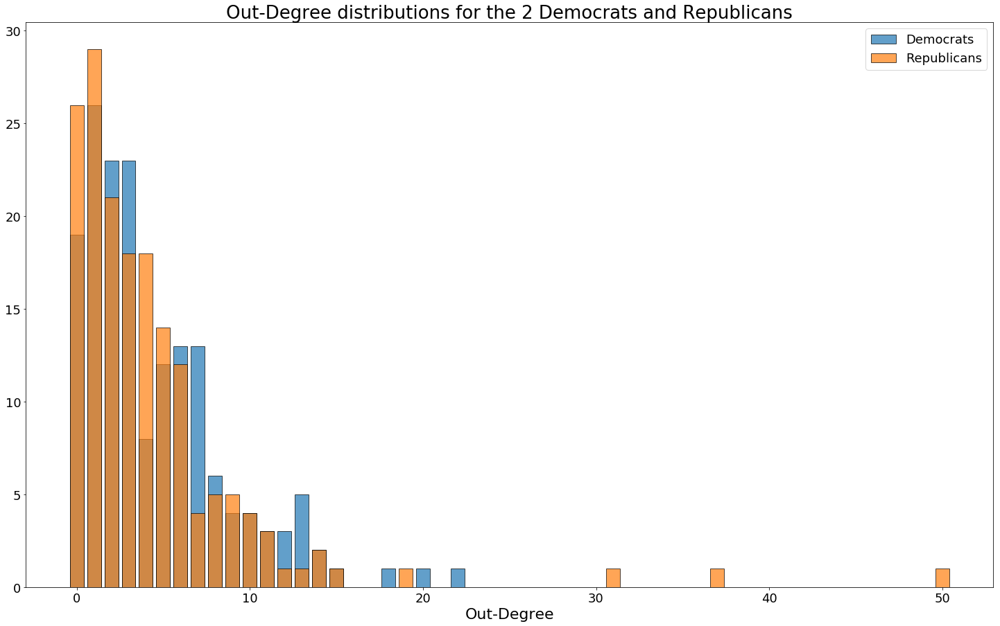

In [278]:
plt.figure(figsize=(25,15))
plt.bar(out_deg_dem.keys(), out_deg_dem.values(), edgecolor='black', alpha = 0.7, label='Democrats')
plt.bar(out_deg_rep.keys(), out_deg_rep.values(), edgecolor='black', alpha = 0.7, label='Republicans')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel('Out-Degree', fontsize=22)
plt.legend(fontsize=18)
plt.title('Out-Degree distributions for the 2 Democrats and Republicans', fontsize=26)
plt.show()


* Find the 3 members of the republican party that have retweeted tweets from democratic members most often. Repeat the measure for the democratic members. Can you explain your results by looking at the Wikipedia pages of these members of the house?



In [286]:
for node in twitter_graph.node:
    node_connections = twitter_graph['Kevin McCarthy']
    for link in node_connections:
        print(link)
        break
    break

Don Bacon


In [280]:
twitter_graph.get_edge_data('Kevin McCarthy','Don Bacon')

{'weight': 2}

True

_Exercise_ 3: Community detection.

* Use your favorite method of community detection to find communities in the full house of representatives network. Report the value of modularity found by the algorithm. Is it higher or lower than what you found for the Wikipedia network (Week 7)? Comment on your result.
* Visualize the network, using the Force Atlas algorithm. This time assign each node a different color based on their *community*. Describe the structure you observe.
* Compare the communities found by your algorithm with the parties by creating a matrix $\mathbf{D}$ with dimension $(B \times C$, where $B$ is the number of parties and $C$ is the number of communities. We set entry $D(i,j)$ to be the number of nodes that party $i$ has in common with community $j$. The matrix $\mathbf{D}$ is what we call a [**confusion matrix**](https://en.wikipedia.org/wiki/Confusion_matrix). 
* Use the confusion matrix to explain how well the communities you've detected correspond to the parties. Consider the following questions
  * Are there any republicans grouped with democrats (and vice versa)?
  * Does the community detection algorithm sub-divide the parties? Do you know anything about American politics that could explain such sub-divisions? Answer in your own words.

# Part 2: What do republican and democratic members tweet about?

_Exercise_ 4: TF-IDF of the republican and democratic tweets.

We will create two documents, one containing the words extracted from tweets of republican members, and the other for Democratic members. We will then use TF-IDF to compare the content of these two documents and create a word-cloud. The procedure you should use is exactly the same you used in exercise 2 of week 7. The main steps are summarized below: 
* Create two large documents, one for the democratic and one for the republican party. Tokenize the pages, and combine the tokens into one long list including all the pages of the members of the same party. 
  * Exclude the twitter handles of other members.
  * Exclude punctuation.
  * Exclude stop words (if you don't know what stop words are, go back and read NLPP1e again).
  * Exclude numbers (since they're difficult to interpret in the word cloud).
  * Set everything to lower case.
  * Compute the TF-IDF for each document.
* Now, create word-cloud for each party. Are these topics less "boring" than the Wikipedia topics from Week 7? Why?  Comment on the results.

# Part 3: Sentiment analysis

_Exercise_ 5: Sentiment over the Twitter data.

* Download the LabMT wordlist. It's available as supplementary material from [Temporal Patterns of Happiness and Information in a Global Social Network: Hedonometrics and Twitter](http://journals.plos.org/plosone/article?id=10.1371/journal.pone.0026752) (Data Set S1). Describe briefly how the list was generated.
* Based on the LabMT word list, write a function that calculates sentiment given a list of tokens (the tokens should be lower case, etc).
* Create two lists: one containing tweets by democratic members, and the other with the tweets of republican members. Calculate the sentiment of each tweet and plot the distribution of sentiment for each of the two lists. Are there significant differences between the two? Which party post more positive tweets?
* Compute the average $m$ and standard deviation $\sigma$  of the Tweets sentiment (considering tweets by both republican and democrats). 
* Now only tweets with sentiment lower than $m-2\sigma$. We will refer to them as *negative* tweets.  Build a list containing *negative* tweets written by democrats, and one for republicans. Compute the TF-IDF on these two lists. Create a word-cloud for each of them. Are there differences between the positive content posted by republican and democrats?
* Repeat the point above, but considering _positive_ tweets (e.g. with sentiment larger than $m+2\sigma$). Comment on your results.


## Here we are downloading the LambMT wordlist.

**Question:** (Data Set S1). Describe briefly how the list was generated.

**Answer:** It was generated based on the output given by people hired at Amazon's Mechanical Turk platform (where people do simple tasks, which cannot be done automatically, for money; e.g. labelling words in text).

In [9]:
import urllib

url = 'https://journals.plos.org/plosone/article/file?id=10.1371/journal.pone.0026752.s001&type=supplementary'
df_sentiment = pd.read_csv(url, skiprows=2, header=None, sep='\t')

# need to set the column names and remove the first row
df_sentiment.columns = df_sentiment.iloc[0]
df_sentiment = df_sentiment.drop(df.index[0]).reset_index()
df_sentiment = df_sentiment.drop(['index'], axis=1)
df_sentiment[['happiness_rank', 'happiness_average', 'happiness_standard_deviation']] = \
df_sentiment[['happiness_rank', 'happiness_average', 'happiness_standard_deviation']].apply(pd.to_numeric)
df_sentiment.head()

NameError: name 'df' is not defined

In [ ]:
import nltk
import pandas as pd

from nltk.corpus import stopwords
from string import punctuation


stopwords = stopwords.words('english')

## Based on the LabMT word list, write a function that calculates sentiment given a list of tokens (the tokens should be lower case, etc).

In [259]:
def get_processed_tokens(text):
    tokens = nltk.word_tokenize(text)
    # excluding numbers, names, stop words respectively
    processed = [word.lower() for word in tokens if word.isnumeric() == False and word not in punctuation] 
    # remove punctuation
    processed = [''.join(c for c in word if c not in punctuation) for word in processed]
    # remove empty words
    processed = [word for word in processed if len(word) > 1]
    # remove stop words
    processed = [word for word in processed if word not in stopwords]
    
    return processed


def calculate_token_list_sentiment(tokens):
    no_words_labeled = len(tokens)
    happines_sum = 0
    
    word_count = 0
    for word in tokens:
        #try:  
        if word in list(df_sentiment['word']):
            word_count += 1
            happines_sum += df_sentiment[df_sentiment['word'] == word]['happiness_average'].item()
        #print(word)
        #print(word_happiness.item())
            
        #except:
        #    no_words_labeled +=1  
    
    if word_count == 0:
        return -1
    return happines_sum / word_count

In [260]:
test_1 = 'Look at happy little trees. So much fun. I love life.'
calculate_token_list_sentiment(get_processed_tokens(test_1))

6.8575

In [261]:
test_2 = 'Blood, suicide, sadness. I want to cut myself, see you at the funeral. Bring some alcohol and drugs'
calculate_token_list_sentiment(get_processed_tokens(test_2))

3.7439999999999998

In [262]:
test_3 = "Gustaw Laura Mark Stephano"
calculate_token_list_sentiment(get_processed_tokens(test_3))

5.53

## Create two lists: one containing tweets by democratic members, and the other with the tweets of republican members.

In [219]:
import os 
import re 

# tweet directory
path = "./tweets_2019_full"

# get data about the politician names, their wiki pages, party and more info
h115_csv_path = './H115_tw_2019.csv'
df_h115 = pd.read_csv(h115_csv_path)

df_h115.head()

,WikiPageName,Party,State,Name,tw_id,tw_name
0,Don_Young,Republican,Alaska,Don Young,3.700727e+07,repdonyoung
1,Jim_Sensenbrenner,Republican,Wisconsin,Jim Sensenbrenner,8.516214e+08,JimPressOffice
2,Hal_Rogers,Republican,Kentucky,Hal Rogers,5.504018e+08,RepHalRogers
3,Chris_Smith_(New_Jersey_politician),Republican,New Jersey,Chris Smith,1.289319e+09,RepChrisSmith
4,Steny_Hoyer,Democratic,Maryland,Steny Hoyer,2.201209e+07,LeaderHoyer


In [220]:
democrats = {}
republicans = {}

for file in os.listdir(path):
    wiki_name = file
    persons_tweets = open(path + '/' + file, encoding= 'utf-8').read()
    
    persons_df_record = df_h115[df_h115['WikiPageName'] == wiki_name] 
    persons_name = persons_df_record['Name'].item()
    persons_party = persons_df_record['Party'].item()
    persons_handle = persons_df_record['tw_name'].item()
    
    handles = re.findall("RT\s\@\w+\:", persons_tweets)
    handle_list = []
    for handle in handles:
        handle_list.append(handle.split("@")[1].split(":")[0])
        
    dict_item =  { 
        "name" : persons_name,
        "wikiname": wiki_name,
        "handle": persons_handle,
        "tweets": persons_tweets
    }
    if persons_party == 'Democratic':
        democrats[wiki_name] = dict_item
    else: 
        republicans[wiki_name] = dict_item

In [221]:
def get_tweets_list(party_dict):
    tweet_list = []
    
    for key, value in party_dict.items():
        all_tweets = value["tweets"] # a string with all tweets separated by new line
        all_tweets = list(filter(None, all_tweets.splitlines())) # a list of seperated tweets
        tweet_list.extend(all_tweets)    
    
    return tweet_list

In [222]:
democrats_tweets = get_tweets_list(democrats)
republicans_tweets = get_tweets_list(republicans)

## Calculate the sentiment of each tweet and plot the distribution of sentiment for each of the two lists.

In [304]:
democrats_tweets_tokens = [get_processed_tokens(x) for x in democrats_tweets]
republicans_tweets_tokens = [get_processed_tokens(x) for x in republicans_tweets]

In [343]:
import time
from IPython.display import clear_output

def get_group_tweets_sentiments(group_tweets_tokens):
    group_tweets_sentiments = []
    for i in range(len(group_tweets_tokens)):        
        tweet_sentiment = calculate_token_list_sentiment(group_tweets_tokens[i])
        if tweet_sentiment != -1:
            group_tweets_sentiments.append(tweet_sentiment)
        
        if (i+1) % round(0.01 * len(group_tweets_tokens)) == 0:
            clear_output(wait=True)
            current_percent = (i+1) / round(0.01 * len(group_tweets_tokens))
            print(f"{current_percent}% done.")
    return group_tweets_sentiments

In [344]:
democrats_tweets_sentiments = get_group_tweets_sentiments(democrats_tweets_tokens)

99.0% done.


In [345]:
republicans_tweets_sentiments = get_group_tweets_sentiments(republicans_tweets_tokens)

99.0% done.


## Plot the distribution of sentiment for each of the two lists

In [2]:
import numpy as np
import matplotlib.pyplot as plt

In [361]:
def plot_sentiment_distribution(group_tweet_sentiments):
    bins = np.linspace(np.min(group_tweet_sentiments), np.max(group_tweet_sentiments))
    results, bins = np.histogram(group_tweet_sentiments, bins)
    plt.plot(bins[:-1], results)
    plt.show()

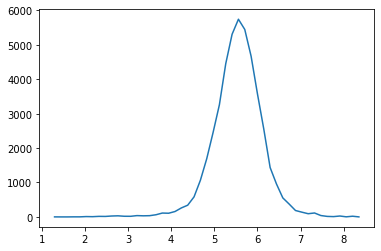

In [362]:
plot_sentiment_distribution(democrats_tweets_sentiments)

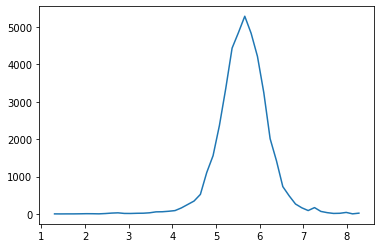

In [363]:
plot_sentiment_distribution(republicans_tweets_sentiments)

**Questions:** 
1. Are there significant differences between the two? 
2. Which party post more positive tweets?

**Answers:**
1. a
2. b

## Compute the average  𝑚  and standard deviation  𝜎  of the Tweets sentiment (considering tweets by both republican and democrats).

In [409]:
all_tweets_sentiments = democrats_tweets_sentiments + republicans_tweets_sentiments

In [407]:
republicans_tweets_sentiments[-1]

5.7069230769230765

In [394]:
all_tweets_sentiments[46047:]

[[5.32,
  5.575,
  3.79,
  5.595,
  5.068,
  5.6499999999999995,
  5.442727272727273,
  5.172857142857143,
  5.909999999999998,
  5.638181818181819,
  4.646666666666666,
  5.86,
  5.075,
  5.132,
  5.16,
  5.3759999999999994,
  5.760000000000001,
  6.22,
  5.823333333333333,
  5.13,
  5.275,
  5.95,
  6.196,
  5.1049999999999995,
  4.8100000000000005,
  6.52,
  5.284615384615384,
  5.385,
  5.515555555555554,
  6.349999999999999,
  6.282222222222223,
  6.086000000000001,
  5.264615384615384,
  5.665833333333334,
  5.601666666666667,
  5.3,
  5.42,
  5.117142857142857,
  6.1375,
  5.473333333333334,
  6.131428571428572,
  5.228999999999999,
  5.5,
  5.953684210526316,
  6.151999999999999,
  5.647999999999999,
  5.5969999999999995,
  5.088235294117648,
  5.158666666666667,
  5.130000000000001,
  5.4,
  5.644444444444444,
  6.005,
  5.4366666666666665,
  5.256,
  5.425454545454546,
  5.672000000000001,
  5.719166666666667,
  5.385454545454546,
  5.915,
  4.331999999999999,
  5.85615384615

In [383]:
all_tweets_sentiments[1]

5.448124999999999

In [417]:
m = np.mean(all_tweets_sentiments)
sigma = np.std(all_tweets_sentiments)
print(f"Average m: {m}")
print(f"Standard deviation sigma: {sigma}")

Average m: 5.657940924846474
Standard deviation sigma: 0.5638970991057082


## Now only tweets with sentiment lower than  𝑚−2𝜎 . We will refer to them as negative tweets. Build a list containing negative tweets written by democrats, and one for republicans. 

In [415]:
len(democrats_tweets)

52476

In [416]:
len(democrats_tweets_sentiments)

46047

In [ ]:
negative_democrats_tweets = democa

## Compute the TF-IDF on these two lists. Create a word-cloud for each of them.

**Question:** Are there differences between the positive content posted by republican and democrats?

**Answer:**